**The Evolution of Video Games from Sales to Satisfaction**

Group Number: 44

Student Name: Faiz Charanyia

Student UT EID: FC8786

Student Name: Rahul Sankar

Student UT EID: rs58865

Student Name: Nicholas Ghimire

Student UT EID: ng24824

Last Updated: 03/20/2024


In [1]:
pip install pycountry

Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd
import numpy as np
import json
from numpy import polyfit, poly1d
from scipy import stats
from sklearn.metrics import mean_squared_error
from numpy import sqrt
import pycountry
import matplotlib.pyplot as plt
import plotly.express as px
import altair as alt
import seaborn as sns
import plotly.graph_objects as go

In [3]:
# https://www.kaggle.com/datasets/beridzeg45/video-games
VGRatingsData = pd.read_csv("./VideoGameRatings.csv")

# https://www.kaggle.com/datasets/ghassenkhaled/video-games-data/
VGSalesData = pd.read_csv("./VideoGameSales.csv")

# Analysis

## Part 1: VGRatings Data

In [4]:
# What is the dataset size (how many rows and columns)?
VGRatingsData.shape

(14055, 9)

In [5]:
# What are the column names?
VGRatingsData.columns

Index(['Title', 'Release Date', 'Developer', 'Publisher', 'Genres',
       'Product Rating', 'User Score', 'User Ratings Count', 'Platforms Info'],
      dtype='object')

***Columns:***

* **Title:** Name of the video game.

* **Release Date:** The release date of the video game.

* **Developer:** The company that developed the video game.

* **Publisher:** The company that published the video game.

* **Genres:** The genre(s) of the video game.

* **Product Rating:** The ESRB rating of the video game.

* **User Score:** The average user score rating.

* **User Ratings Count:** The number of user ratings.

* **Platforms Info:** Information about the platforms the video game is available on, including platform-specific metascores.

In [6]:
# classifying each column
column_classification = {
    'Title': 'categorical',
    'Release Date': 'ordinal',
    'Developer': 'categorical',
    'Publisher': 'categorical',
    'Genres': 'categorical',
    'Product Rating': 'ordinal',
    'User Score': 'continuous',
    'User Ratings Count': 'discrete',
    'Platforms Info': 'categorical'
}

column_classification

{'Title': 'categorical',
 'Release Date': 'ordinal',
 'Developer': 'categorical',
 'Publisher': 'categorical',
 'Genres': 'categorical',
 'Product Rating': 'ordinal',
 'User Score': 'continuous',
 'User Ratings Count': 'discrete',
 'Platforms Info': 'categorical'}

In [7]:
# For categorical data, find the discrete values.
cat_columns = [col for col, col_type in column_classification.items() if col_type == 'categorical']
cat_data_analysis = {}

for col in cat_columns:
    unique_values = VGRatingsData[col].dropna().unique()
    value_counts = VGRatingsData[col].value_counts()
    mode = value_counts.idxmax()
    cat_data_analysis[col] = {
        'unique_values_count': len(unique_values),
        'mode': mode,
        'mode_count': value_counts.max(),
        'top_5': value_counts[0:5].to_dict()
    }

In [8]:
cat_data_analysis['Developer']['top_5']

{'Capcom': 184,
 'Nintendo': 152,
 'Telltale Games': 115,
 'Konami': 105,
 'Square Enix': 84}

In [9]:
cat_data_analysis['Publisher']['top_5']

{'Nintendo': 617,
 'Ubisoft': 449,
 'Sega': 409,
 'SCEA': 407,
 'Electronic Arts': 388}

In [10]:
cat_data_analysis['Genres']['top_5']

{'Action Adventure': 732,
 '2D Platformer': 716,
 'Action RPG': 642,
 'FPS': 583,
 'Action': 472}

In [11]:
cat_data_analysis['Platforms Info']['top_5']

{'[]': 29,
 "[{'Platform': 'iOS (iPhone/iPad)', 'Platform Metascore': '83', 'Platform Metascore Count': 'Based on 7 Critic Reviews'}]": 12,
 "[{'Platform': 'iOS (iPhone/iPad)', 'Platform Metascore': '78', 'Platform Metascore Count': 'Based on 8 Critic Reviews'}]": 11,
 "[{'Platform': 'iOS (iPhone/iPad)', 'Platform Metascore': '78', 'Platform Metascore Count': 'Based on 7 Critic Reviews'}]": 11,
 "[{'Platform': 'iOS (iPhone/iPad)', 'Platform Metascore': '75', 'Platform Metascore Count': 'Based on 7 Critic Reviews'}]": 10}

In [12]:
print("Title Column:\n")
print("Mode:", cat_data_analysis['Title']['mode'])
print("Mode_Count:",cat_data_analysis['Title']['mode_count'])
print("Unique_Values:",cat_data_analysis['Title']['unique_values_count'])

Title Column:

Mode: Ziggurat (2012)
Mode_Count: 1
Unique_Values: 14034


In [13]:
print("Developer Column:\n")
print("Mode:", cat_data_analysis['Developer']['mode'])
print("Mode Count:",cat_data_analysis['Developer']['mode_count'])
print("Unique Values:",cat_data_analysis['Developer']['unique_values_count'])

Developer Column:

Mode: Capcom
Mode Count: 184
Unique Values: 4449


In [14]:
print("Publisher Column:\n")
print("Mode:", cat_data_analysis['Publisher']['mode'])
print("Mode Count:",cat_data_analysis['Publisher']['mode_count'])
print("Unique Values:",cat_data_analysis['Publisher']['unique_values_count'])

Publisher Column:

Mode: Nintendo
Mode Count: 617
Unique Values: 2307


In [15]:
print("Genres Column:\n")
print("Mode:", cat_data_analysis['Genres']['mode'])
print("Mode Count:",cat_data_analysis['Genres']['mode_count'])
print("Unique Values:",cat_data_analysis['Genres']['unique_values_count'])

Genres Column:

Mode: Action Adventure
Mode Count: 732
Unique Values: 119


In [16]:
print("Platforms Info Column:\n")
print("Mode:", cat_data_analysis['Platforms Info']['mode'])
print("Mode Count:",cat_data_analysis['Platforms Info']['mode_count'])
print("Unique Values:",cat_data_analysis['Platforms Info']['unique_values_count'])

Platforms Info Column:

Mode: []
Mode Count: 29
Unique Values: 11956


In [17]:
# analyzing quantitative data
quant_columns = ['User Score', 'User Ratings Count']
quant_data_analysis = {}

for col in quant_columns:
    col_data = VGRatingsData[col].dropna()
    quant_data_analysis[col] = {
        'range': (col_data.min(), col_data.max()),
        'median': np.median(col_data),
        'mean': np.mean(col_data),
        'standard_deviation': np.std(col_data)
    }

quant_data_analysis

{'User Score': {'range': (0.3, 10.0),
  'median': 7.2,
  'mean': 6.894852313471061,
  'standard_deviation': 1.3921540308808014},
 'User Ratings Count': {'range': (5.0, 163419.0),
  'median': 34.0,
  'mean': 245.6429772546243,
  'standard_deviation': 1847.8135789968221}}

User Score: The unit is based on a scale from 0 to 10, representing an average rating given by users.

User Ratings Count: Represents the count of individual ratings provided by users for each game.

## Part 1: VGSales Data

In [18]:
VGSalesData.shape

(16719, 16)

In [19]:
VGSalesData.columns

Index(['Name', 'Platform', 'Year_of_Release', 'Genre', 'Publisher', 'NA_Sales',
       'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales', 'Critic_Score',
       'Critic_Count', 'User_Score', 'User_Count', 'Developer', 'Rating'],
      dtype='object')

Name: The name of the video game.

Platform: The platform on which the game was released.

Year_of_Release: The year the game was released.

Genre: The genre of the game.

Publisher: The company that published the game.

NA_Sales: Sales in North America (in millions).

EU_Sales: Sales in Europe (in millions).

JP_Sales: Sales in Japan (in millions).

Other_Sales: Sales in other regions (in millions).

Global_Sales: Total worldwide sales (in millions).

Critic_Score: Average score given by critics.

Critic_Count: The number of critics who reviewed the game.

User_Score: Average score given by users.

User_Count: The number of users who rated the game.

Developer: The company that developed the game.

Rating: The ESRB rating of the game.

In [20]:
# classify each column
column_classification_sales = {
    'Name': 'categorical',
    'Platform': 'categorical',
    'Year_of_Release': 'ordinal',
    'Genre': 'categorical',
    'Publisher': 'categorical',
    'NA_Sales': 'continuous',
    'EU_Sales': 'continuous',
    'JP_Sales': 'continuous',
    'Other_Sales': 'continuous',
    'Global_Sales': 'continuous',
    'Critic_Score': 'continuous',
    'Critic_Count': 'discrete',
    'User_Score': 'continuous',
    'User_Count': 'discrete',
    'Developer': 'categorical',
    'Rating': 'ordinal'
}

In [21]:
# analyze the categorical data
cat_columns_sales = [col for col, col_type in column_classification_sales.items() if col_type == 'categorical']
cat_data_analysis_sales = {}

for col in cat_columns_sales:
    unique_values = VGSalesData[col].dropna().unique()
    value_counts = VGSalesData[col].value_counts()
    mode = value_counts.idxmax()
    cat_data_analysis_sales[col] = {
        'unique_values_count': len(unique_values),
        'mode': mode,
        'mode_count': value_counts.max(),
        'discrete_values': value_counts.to_dict()
    }

In [22]:
# for categorical data, show various counts of each discrete value, ordered
#for col in cat_columns_sales:
#    print(col)
#    print(cat_data_analysis_sales[col]['discrete_values'])
#    print("\n")

In [23]:
# mode of discrete values
for col in cat_columns_sales:
    print(col)
    print("Mode:", cat_data_analysis_sales[col]['mode'])
    print("Mode_Count:", cat_data_analysis_sales[col]['mode_count'])
    print("Unique Values:", cat_data_analysis_sales[col]['unique_values_count'])
    print("\n")

Name
Mode: Need for Speed: Most Wanted
Mode_Count: 12
Unique Values: 11562


Platform
Mode: PS2
Mode_Count: 2161
Unique Values: 31


Genre
Mode: Action
Mode_Count: 3370
Unique Values: 12


Publisher
Mode: Electronic Arts
Mode_Count: 1356
Unique Values: 581


Developer
Mode: Ubisoft
Mode_Count: 204
Unique Values: 1696




In [24]:
# analyze quantitative data
quant_columns_sales = [col for col, col_type in column_classification_sales.items() if col_type in ['discrete', 'continuous']]
quant_data_analysis_sales = {}

# convert 'tbd' to NaN
VGSalesData['User_Score'] = pd.to_numeric(VGSalesData['User_Score'], errors='coerce')

for col in quant_columns_sales:
    col_data = VGSalesData[col].dropna()
    quant_data_analysis_sales[col] = {
        'range': (col_data.min(), col_data.max()),
        'median': col_data.median(),
        'mean': col_data.mean(),
        'std_dev': col_data.std()
    }

In [25]:
for item in quant_data_analysis_sales:
    print(item)
    print(quant_data_analysis_sales[item])
    print()

NA_Sales
{'range': (0.0, 41.36), 'median': 0.08, 'mean': 0.26333034272384714, 'std_dev': 0.8135138347516405}

EU_Sales
{'range': (0.0, 28.96), 'median': 0.02, 'mean': 0.14502482205873557, 'std_dev': 0.503283296094286}

JP_Sales
{'range': (0.0, 10.22), 'median': 0.0, 'mean': 0.07760212931395419, 'std_dev': 0.3088180805146343}

Other_Sales
{'range': (0.0, 10.57), 'median': 0.01, 'mean': 0.04733177821640051, 'std_dev': 0.18670989698950866}

Global_Sales
{'range': (0.01, 82.53), 'median': 0.17, 'mean': 0.5335426759973684, 'std_dev': 1.5479351247177218}

Critic_Score
{'range': (13.0, 98.0), 'median': 71.0, 'mean': 68.96767850559173, 'std_dev': 13.938164552843201}

Critic_Count
{'range': (3.0, 113.0), 'median': 21.0, 'mean': 26.360820941378886, 'std_dev': 18.98049453458247}

User_Score
{'range': (0.0, 9.7), 'median': 7.5, 'mean': 7.125046113306983, 'std_dev': 1.500006093625791}

User_Count
{'range': (4.0, 10665.0), 'median': 24.0, 'mean': 162.22990777338603, 'std_dev': 561.282326247378}



## Part 2: Data Wrangling for VGRatings

In [26]:
# identify missing Data
print("Missing Count:\n",VGRatingsData.isnull().sum(), "\n\n")

# initial assessment of data types for format correction
print(VGRatingsData.dtypes)

Missing Count:
 Title                   21
Release Date            64
Developer              138
Publisher              138
Genres                  21
Product Rating        3050
User Score            2341
User Ratings Count    2756
Platforms Info           0
dtype: int64 


Title                  object
Release Date           object
Developer              object
Publisher              object
Genres                 object
Product Rating         object
User Score            float64
User Ratings Count    float64
Platforms Info         object
dtype: object


In [27]:
VGRatingsData['Title'].mode()

0                                #DRIVE
1                                #IDARB
2                       #KILLALLZOMBIES
3                         'Splosion Man
4                              .detuned
                      ...              
14029                  simian.interface
14030       theHunter: Call of the Wild
14031                      uDraw Studio
14032    void tRrLM(); //Void Terrarium
14033                               xXx
Name: Title, Length: 14034, dtype: object

In [28]:
# TITLE
# All titles in the ratings data set are unique, so can't replace missing ones with mode (all titles are the "mode")
# We also may not want to remove the rows since we may able to use other features such as genre for our analysis
# Result: if it is missing title and genre --> remove it (losing less than 20 rows out of 14000+)

# find rows where both 'Title' and 'Genres' are missing
missing_title_genres = VGRatingsData[(VGRatingsData['Title'].isnull()) & (VGRatingsData['Genres'].isnull())]

missing_title_genres

,Title,Release Date,Developer,Publisher,Genres,Product Rating,User Score,User Ratings Count,Platforms Info
4681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[]
5391,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[]
5394,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[]
5419,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[]
5424,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[]
5446,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[]
5455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[]
5492,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[]
5548,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[]
5571,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[]


In [29]:
# seems like there are 21 empty rows, we will drop all of these
# this takes care of all missing data for both title and genre columns

# dropping these rows from `ratings_data`
VGRatingsData = VGRatingsData.drop(missing_title_genres.index)

# checking empty rows are dropped
VGRatingsData[(VGRatingsData['Title'].isnull()) & (VGRatingsData['Genres'].isnull())]

,Title,Release Date,Developer,Publisher,Genres,Product Rating,User Score,User Ratings Count,Platforms Info


In [30]:
# updated missing data
VGRatingsData.isnull().sum()

Title                    0
Release Date            43
Developer              117
Publisher              117
Genres                   0
Product Rating        3029
User Score            2320
User Ratings Count    2735
Platforms Info           0
dtype: int64

In [31]:
# check date data type
print(VGRatingsData['Release Date'].dtype)
print(type(VGRatingsData['Release Date'][0]))

object
<class 'str'>


In [32]:
# it is a str and needs to be date

# convert 'Release Date' column from string to datetime
VGRatingsData['Release Date'] = pd.to_datetime(VGRatingsData['Release Date'])

# verify change
print(VGRatingsData['Release Date'].dtype)
print(type(VGRatingsData['Release Date'][0]))
print(VGRatingsData)

datetime64[ns]
<class 'pandas._libs.tslibs.timestamps.Timestamp'>
                                                   Title Release Date  \
0                                        Ziggurat (2012)   2012-02-17   
1                                              4X4 EVO 2   2001-11-15   
2                                        MotoGP 2 (2001)   2002-01-22   
3                                               Gothic 3   2006-11-14   
4                          Siege Survival: Gloria Victis   2021-05-18   
...                                                  ...          ...   
14050                    Dragon Age: Origins - Awakening   2010-03-16   
14051                                      Lover Pretend   2022-12-01   
14052                             Alice: Madness Returns   2011-06-14   
14053                                     Concrete Genie   2019-10-08   
14054  Lemony Snicket's A Series of Unfortunate Event...   2004-11-10   

                         Developer                       

In [33]:
# examine missing release date info
VGRatingsData[VGRatingsData['Release Date'].isnull()]

,Title,Release Date,Developer,Publisher,Genres,Product Rating,User Score,User Ratings Count,Platforms Info
571,Chaser (2003),NaT,Cauldron Ltd.,Encore Software,FPS,Rated M For Mature,NaN,NaN,"[{'Platform': 'PC', 'Platform Metascore': '66'..."
1064,Soul Axiom,NaT,NaN,NaN,First-Person Adventure,NaN,NaN,NaN,"[{'Platform': 'PC', 'Platform Metascore': '57'..."
1318,American Conquest,NaT,GSC Game World,cdv Software,Command RTS,Rated T For Teen,NaN,NaN,"[{'Platform': 'PC', 'Platform Metascore': '76'..."
1739,Monster Trucks DS,NaT,Skyworks Technologies,Majesco,Auto Racing Sim,Rated E For Everyone,NaN,NaN,"[{'Platform': 'DS', 'Platform Metascore': '33'..."
2827,Wetrix,NaT,Zed Two Limited,Ocean,Puzzle,Rated E For Everyone,NaN,NaN,"[{'Platform': 'Nintendo 64', 'Platform Metasco..."
3104,T-72: Balkans on Fire,NaT,IDDK,Battlefront.com,Vehicle Combat Sim,NaN,NaN,NaN,"[{'Platform': 'PC', 'Platform Metascore': '74'..."
3702,Soul Edge,NaT,Namco,Namco,3D Fighting,Rated T For Teen,NaN,NaN,"[{'Platform': 'PlayStation', 'Platform Metasco..."
4674,Fetch!,NaT,NaN,NaN,Action,Rated E For Everyone,NaN,NaN,[]
4944,Myst IV: Revelation,NaT,Ubisoft Montreal,Ubisoft,First-Person Adventure,Rated T For Teen,NaN,NaN,"[{'Platform': 'PC', 'Platform Metascore': '82'..."
5154,Arcana Heart 3,NaT,Examu,Aksys Games,2D Fighting,Rated T For Teen,NaN,NaN,"[{'Platform': 'Xbox 360', 'Platform Metascore'..."


In [34]:
# release date mode & count
release_date_mode = VGRatingsData['Release Date'].mode()[0]
print(release_date_mode)
print(VGRatingsData[VGRatingsData['Release Date'] == release_date_mode].shape[0])

2006-11-14 00:00:00
27


In [35]:
# There are 43 rows missing release dates, and the mode occurs even fewer at 27 times
# as a result, it may be overly exagerative to replace all the missing dates with this mode
# given that these rows are also missing user ratings (primary study of this data set), we will drop this small subset of rows
# dropping rows where 'Release Date' is missing
VGRatingsData = VGRatingsData.dropna(subset=['Release Date'])

# updated missing data
VGRatingsData.isnull().sum()

Title                    0
Release Date             0
Developer              113
Publisher              113
Genres                   0
Product Rating        3013
User Score            2277
User Ratings Count    2692
Platforms Info           0
dtype: int64

In [36]:
# USER SCORES
# missing scores by genre
missing_scores_by_genre = VGRatingsData.groupby('Genres')['User Score'].apply(lambda x: x.isnull().sum()).reset_index(name='Missing User Scores')

print(missing_scores_by_genre)

             Genres  Missing User Scores
0    2D Beat-'Em-Up                   23
1       2D Fighting                   17
2     2D Platformer                  108
3    3D Beat-'Em-Up                   13
4       3D Fighting                   12
..              ...                  ...
114     Virtual Pet                    1
115    Visual Novel                   10
116      Volleyball                    5
117     Western RPG                    1
118       Wrestling                   11

[119 rows x 2 columns]


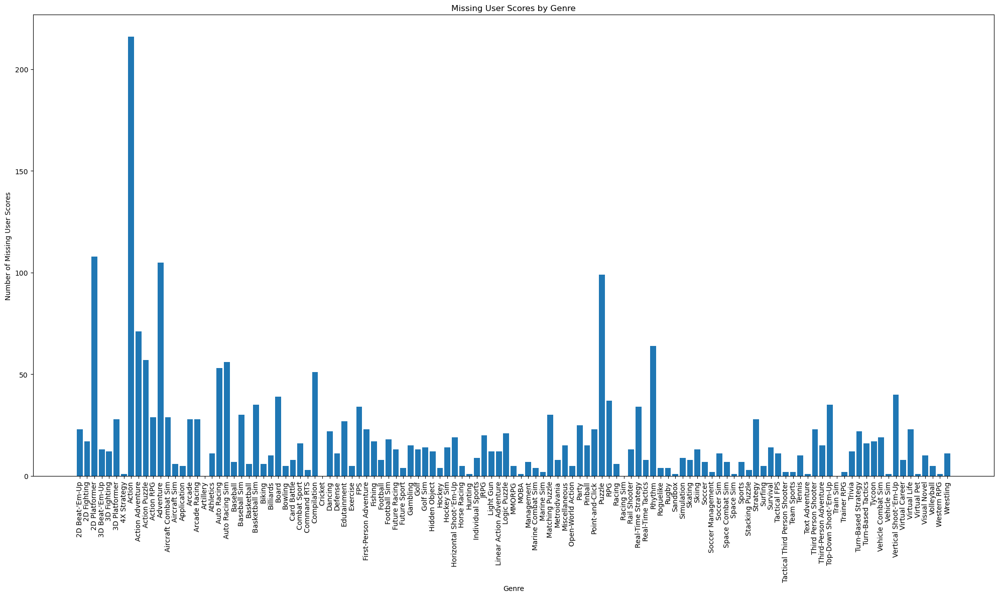

In [37]:
# Plotting
plt.figure(figsize=(20, 12))
plt.bar(missing_scores_by_genre['Genres'], missing_scores_by_genre['Missing User Scores'])
plt.title('Missing User Scores by Genre')
plt.xlabel('Genre')
plt.ylabel('Number of Missing User Scores')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

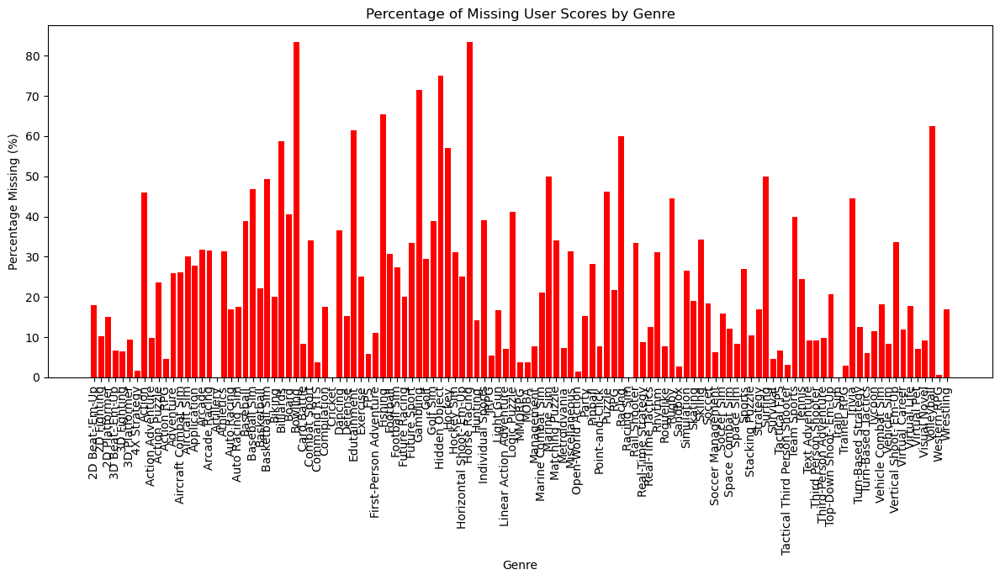

In [38]:
# plot the percentage of rows with missing scores per genre

# total number of games per genre
total_games_by_genre = VGRatingsData.groupby('Genres').size()

# number of missing user scores by genre
missing_scores_by_genre = VGRatingsData.groupby('Genres')['User Score'].apply(lambda x: x.isnull().sum())

# calculating the percentage of missing user scores per genre
percentage_missing_scores = (missing_scores_by_genre / total_games_by_genre * 100).reset_index(name='Percentage Missing User Scores')

# plotting  the percentage of missing user scores per genre
plt.figure(figsize=(12, 7))
plt.bar(percentage_missing_scores['Genres'], percentage_missing_scores['Percentage Missing User Scores'], color='red')
plt.title('Percentage of Missing User Scores by Genre')
plt.xlabel('Genre')
plt.ylabel('Percentage Missing (%)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [39]:
missing_50_plus_genres = percentage_missing_scores[percentage_missing_scores['Percentage Missing User Scores'] > 50]['Genres']
missing_50_plus_genres

26         Billiards
28           Bowling
36       Edutainment
40           Fishing
45          Gambling
48     Hidden Object
49            Hockey
52      Horse Racing
73            Racing
116       Volleyball
Name: Genres, dtype: object

In [40]:
# find counts for each of these genres
genre_counts = {}

for genre in missing_50_plus_genres:
    count = VGRatingsData[VGRatingsData['Genres'].str.contains(genre)].shape[0]
    genre_counts[genre] = count

genre_counts

{'Billiards': 17,
 'Bowling': 6,
 'Edutainment': 44,
 'Fishing': 26,
 'Gambling': 21,
 'Hidden Object': 16,
 'Hockey': 52,
 'Horse Racing': 6,
 'Racing': 802,
 'Volleyball': 8}

In [41]:
# SUMMARY
# we believe we will introduce bias by filling missing user score data with the average
# for example: there is chance that these games are missing data because they are particularly bad
# given that we still have around 12000 games after dropping these rows, our dataset remains suffeciently large

# after a thorough analsys of this field we noticed that only 10 genres would lose more than 50% of data,
# and all of these ten (except racing) make up less than 52 rows of the df each.
# while this negates our ability to answer questions about these genres, we cannot introduce bias into the dataframe
# by replaceing more than 50% of some genres

VGRatingsData = VGRatingsData.dropna(subset=['User Score'])

# updated missing data
VGRatingsData.isnull().sum()

Title                    0
Release Date             0
Developer               46
Publisher               46
Genres                   0
Product Rating        2254
User Score               0
User Ratings Count     415
Platforms Info           0
dtype: int64

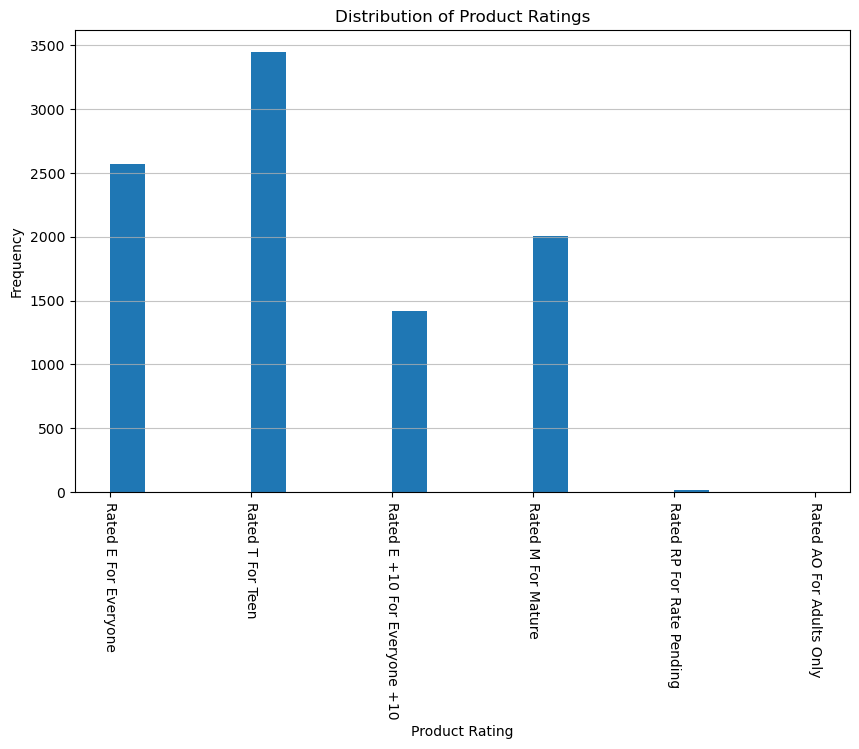

In [42]:
# investigate
plt.figure(figsize=(10, 6))
plt.hist(VGRatingsData['Product Rating'].dropna(), bins=20)
plt.title('Distribution of Product Ratings')
plt.xlabel('Product Rating')
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.75)
plt.xticks(rotation=270)

plt.show()

In [43]:
# we are missing product ratings but these dont need to be filled as they are not central
# to our analysis. Filling 2254 rows in may bias the data if were to investigate it
# as a result, we will just fill the Nas with "Missing" and come back to it if it becomes relvant to the analysis

VGRatingsData['Product Rating'] = VGRatingsData['Product Rating'].fillna('Missing')

# updated missing data
VGRatingsData.isnull().sum()

Title                   0
Release Date            0
Developer              46
Publisher              46
Genres                  0
Product Rating          0
User Score              0
User Ratings Count    415
Platforms Info          0
dtype: int64

In [44]:
# lastly for developers and publishers, we will fill these in with the mode
# these may not be central to the analysis, so this should work
# the mode is a significant leader in both variables, so that also helps

# fill NaN values with the mode
VGRatingsData['Developer'] = VGRatingsData['Developer'].fillna(VGRatingsData['Developer'].mode()[0] )
VGRatingsData['Publisher'] = VGRatingsData['Publisher'].fillna(VGRatingsData['Publisher'].mode()[0] )

# updated missing data
VGRatingsData.isnull().sum()

Title                   0
Release Date            0
Developer               0
Publisher               0
Genres                  0
Product Rating          0
User Score              0
User Ratings Count    415
Platforms Info          0
dtype: int64

In [45]:
# User ratings count
# this is a key variable in our analsysi with high standard deviation.
# filling in with mean may not be ideal here
VGRatingsData[VGRatingsData['User Ratings Count'].isna()]

,Title,Release Date,Developer,Publisher,Genres,Product Rating,User Score,User Ratings Count,Platforms Info
2,MotoGP 2 (2001),2002-01-22,Namco,Namco,Auto Racing Sim,Rated E For Everyone,5.8,NaN,"[{'Platform': 'PlayStation 2', 'Platform Metas..."
40,Smelter,2021-04-22,X Plus,DANGEN Entertainment,2D Platformer,Rated T For Teen,6.8,NaN,"[{'Platform': 'PlayStation 4', 'Platform Metas..."
53,MotoGP 2,2003-05-21,Climax Studios,THQ,Auto Racing Sim,Rated E For Everyone,4.8,NaN,"[{'Platform': 'Xbox', 'Platform Metascore': '8..."
96,Pirates vs Ninjas Dodgeball,2008-09-03,Blazing Lizard,SouthPeak Games,Individual Sports,Rated E +10 For Everyone +10,8.0,NaN,"[{'Platform': 'Xbox 360', 'Platform Metascore'..."
117,World War II: Frontline Command,2003-06-27,The Bitmap Brothers,Strategy First,Real-Time Strategy,Rated T For Teen,6.0,NaN,"[{'Platform': 'PC', 'Platform Metascore': '70'..."
...,...,...,...,...,...,...,...,...,...
13939,Bomberman Tournament,2001-06-29,Amble,Activision,Open-World Action,Rated E For Everyone,8.3,NaN,"[{'Platform': 'Game Boy Advance', 'Platform Me..."
13960,Groovin' Blocks,2008-09-08,Empty Clip Studios,Empty Clip Studios,Rhythm,Rated E For Everyone,6.8,NaN,"[{'Platform': 'Wii', 'Platform Metascore': '75..."
13972,Death Tank,2009-02-18,Snowblind Studios,Microsoft Game Studios,Turn-Based Strategy,Rated E +10 For Everyone +10,7.3,NaN,"[{'Platform': 'Xbox 360', 'Platform Metascore'..."
13993,Glory Days 2,2007-08-06,odenis studio,Eidos Interactive,Vertical Shoot-'Em-Up,Rated E +10 For Everyone +10,6.5,NaN,"[{'Platform': 'DS', 'Platform Metascore': '73'..."


In [46]:
missing_URC_by_genre = VGRatingsData.groupby('Genres')['User Ratings Count'].apply(lambda x: x.isnull().sum()).reset_index(name='Missing URC')

print(missing_URC_by_genre)

             Genres  Missing URC
0    2D Beat-'Em-Up            2
1       2D Fighting            3
2     2D Platformer           17
3    3D Beat-'Em-Up            5
4       3D Fighting            3
..              ...          ...
114     Virtual Pet            2
115    Visual Novel            4
116      Volleyball            0
117     Western RPG            1
118       Wrestling            2

[119 rows x 2 columns]


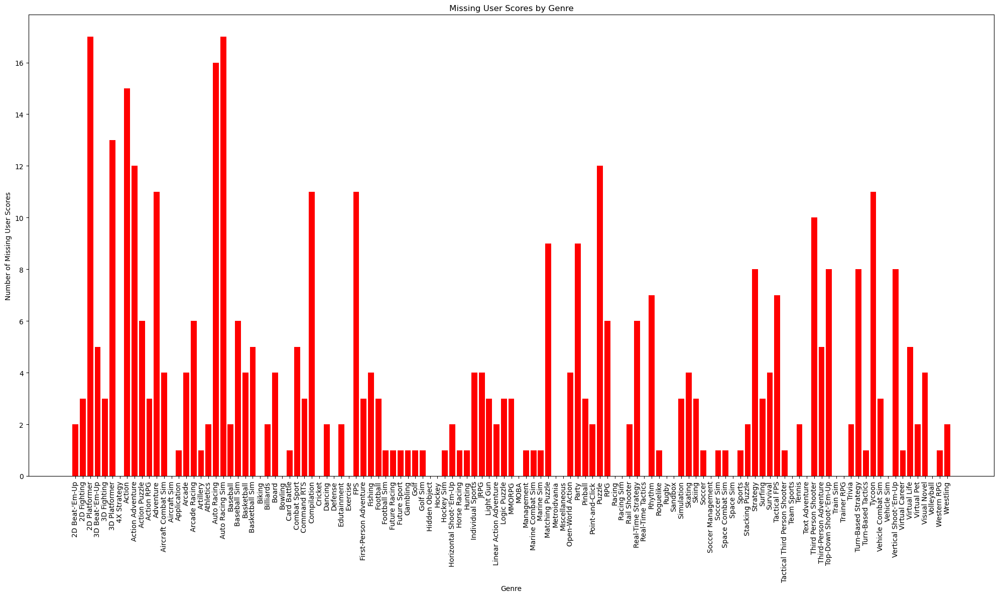

In [47]:
plt.figure(figsize=(20, 12))
plt.bar(missing_URC_by_genre['Genres'], missing_URC_by_genre['Missing URC'], color='red')
plt.title('Missing User Scores by Genre')
plt.xlabel('Genre')
plt.ylabel('Number of Missing User Scores')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [48]:
# less than 20 rows will be dropped from genre --> we drop missing URC
VGRatingsData = VGRatingsData.dropna(subset=['User Ratings Count'])

# updated missing data
VGRatingsData.isnull().sum()

Title                 0
Release Date          0
Developer             0
Publisher             0
Genres                0
Product Rating        0
User Score            0
User Ratings Count    0
Platforms Info        0
dtype: int64

In [49]:
# I am suspicios of platform data

# check for unusually short entries
VGRatingsData[VGRatingsData['Platforms Info'].str.len() < 5]

,Title,Release Date,Developer,Publisher,Genres,Product Rating,User Score,User Ratings Count,Platforms Info
4802,Death Rally,1996-12-31,Remedy Entertainment,GT Interactive,Auto Racing,Rated T For Teen,8.7,34.0,[]


In [50]:
# we don't anticipate using this field, but i'll go ahead and relable this to "Missing"
VGRatingsData.loc[4802, 'Platforms Info'] = "Missing"

In [51]:
VGRatingsData.loc[4802]

Title                          Death Rally
Release Date           1996-12-31 00:00:00
Developer             Remedy Entertainment
Publisher                   GT Interactive
Genres                         Auto Racing
Product Rating            Rated T For Teen
User Score                             8.7
User Ratings Count                    34.0
Platforms Info                     Missing
Name: 4802, dtype: object

In [52]:
# ALL MISSING VALUES FIXED IN VGRatingsData

In [53]:
# Data validation

# Analyzing quantitative data (post wrangling)
quant_columns = ['User Score', 'User Ratings Count']
quant_data_analysis = {}

for col in quant_columns:
    col_data = VGRatingsData[col].dropna()
    quant_data_analysis[col] = {
        'range': (col_data.min(), col_data.max()),
        'median': np.median(col_data),
        'mean': np.mean(col_data),
        'standard_deviation': np.std(col_data)
    }

quant_data_analysis

{'User Score': {'range': (0.3, 9.8),
  'median': 7.2,
  'mean': 6.922028498097177,
  'standard_deviation': 1.37577459638194},
 'User Ratings Count': {'range': (5.0, 163419.0),
  'median': 34.0,
  'mean': 245.6429772546243,
  'standard_deviation': 1847.8135789968221}}

In [54]:
# ranges above for numerical columns is valid

In [55]:
# check for duplicates
VGRatingsData[VGRatingsData.duplicated()]
# no duplicates

,Title,Release Date,Developer,Publisher,Genres,Product Rating,User Score,User Ratings Count,Platforms Info


In [56]:
# helper function parsing JSON-like data
def parse_platform_info(platform_info_str):
    try:
        # json to dict
        platform_info_list = json.loads(platform_info_str.replace("'", '"'))
        return [info['Platform'] for info in platform_info_list if 'Platform' in info]
    except json.JSONDecodeError:
        return []
VGRatingsData['Platforms'] = VGRatingsData['Platforms Info'].apply(parse_platform_info)

In [57]:
VGRatingsData

,Title,Release Date,Developer,Publisher,Genres,Product Rating,User Score,User Ratings Count,Platforms Info,Platforms
0,Ziggurat (2012),2012-02-17,Action Button Entertainment,Freshuu Inc.,Action,Missing,6.9,14.0,"[{'Platform': 'iOS (iPhone/iPad)', 'Platform M...",[iOS (iPhone/iPad)]
3,Gothic 3,2006-11-14,Piranha Bytes,Aspyr,Western RPG,Rated T For Teen,7.5,832.0,"[{'Platform': 'PC', 'Platform Metascore': '63'...",[PC]
4,Siege Survival: Gloria Victis,2021-05-18,FishTankStudio,Black Eye Games,RPG,Missing,6.5,10.0,"[{'Platform': 'PC', 'Platform Metascore': '69'...",[PC]
5,Guitar Hero III: Legends of Rock,2007-10-28,Neversoft Entertainment,RedOctane,Rhythm,Rated T For Teen,8.4,144.0,"[{'Platform': 'Wii', 'Platform Metascore': '86...","[Wii, PlayStation 2, PlayStation 3, Xbox 360, PC]"
7,Xenoraid,2016-11-08,10tons,10tons,Vertical Shoot-'Em-Up,Rated E +10 For Everyone +10,6.2,6.0,"[{'Platform': 'PlayStation 4', 'Platform Metas...","[PlayStation 4, PlayStation Vita, PC, Xbox One..."
...,...,...,...,...,...,...,...,...,...,...
14048,Inversion,2012-06-05,Saber Interactive,Namco Bandai Games,Third Person Shooter,Rated M For Mature,6.4,81.0,"[{'Platform': 'PC', 'Platform Metascore': '59'...","[PC, Xbox 360, PlayStation 3]"
14049,Harold,2015-02-12,Moon Spider Studio,Moon Spider Studio,2D Platformer,Missing,6.0,11.0,"[{'Platform': 'PC', 'Platform Metascore': '70'...",[PC]
14050,Dragon Age: Origins - Awakening,2010-03-16,BioWare,Electronic Arts,Western RPG,Rated M For Mature,8.0,516.0,"[{'Platform': 'PlayStation 3', 'Platform Metas...","[PlayStation 3, Xbox 360, PC]"
14052,Alice: Madness Returns,2011-06-14,Spicy Horse,Electronic Arts,Survival,Rated M For Mature,8.3,276.0,"[{'Platform': 'PC', 'Platform Metascore': '75'...","[PC, PlayStation 3, Xbox 360]"


## Part 2: Data Wrangling for VGSalesData

In [58]:
print(VGSalesData.isnull().sum())
print()
print(VGSalesData.dtypes)
print()
print(VGSalesData.shape)

Name                  2
Platform              0
Year_of_Release     269
Genre                 2
Publisher            54
NA_Sales              0
EU_Sales              0
JP_Sales              0
Other_Sales           0
Global_Sales          0
Critic_Score       8582
Critic_Count       8582
User_Score         9129
User_Count         9129
Developer          6623
Rating             6769
dtype: int64

Name                object
Platform            object
Year_of_Release    float64
Genre               object
Publisher           object
NA_Sales           float64
EU_Sales           float64
JP_Sales           float64
Other_Sales        float64
Global_Sales       float64
Critic_Score       float64
Critic_Count       float64
User_Score         float64
User_Count         float64
Developer           object
Rating              object
dtype: object

(16719, 16)


In [59]:
# caveat, we will not be utilizing the database for user scores, user count, critic scores
# or critic count, developer or rating
# this info may be supplemental to our analysis of sales but not required, so we will leave those as NaNs

# lets see what the rows look like for missing year_of_release
VGSalesData[VGSalesData['Year_of_Release'].isna()]

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
183,Madden NFL 2004,PS2,NaN,Sports,Electronic Arts,4.26,0.26,0.01,0.71,5.23,94.0,29.0,8.5,140.0,EA Tiburon,E
377,FIFA Soccer 2004,PS2,NaN,Sports,Electronic Arts,0.59,2.36,0.04,0.51,3.49,84.0,20.0,6.4,76.0,EA Canada,E
456,LEGO Batman: The Videogame,Wii,NaN,Action,Warner Bros. Interactive Entertainment,1.80,0.97,0.00,0.29,3.06,74.0,17.0,7.9,22.0,Traveller's Tales,E10+
475,wwe Smackdown vs. Raw 2006,PS2,NaN,Fighting,NaN,1.57,1.02,0.00,0.41,3.00,NaN,NaN,NaN,NaN,NaN,NaN
609,Space Invaders,2600,NaN,Shooter,Atari,2.36,0.14,0.00,0.03,2.53,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16376,PDC World Championship Darts 2008,PSP,NaN,Sports,Oxygen Interactive,0.01,0.00,0.00,0.00,0.01,43.0,7.0,NaN,NaN,Oxygen Interactive,E10+
16409,Freaky Flyers,GC,NaN,Racing,Unknown,0.01,0.00,0.00,0.00,0.01,69.0,14.0,6.5,6.0,Midway,T
16452,Inversion,PC,NaN,Shooter,Namco Bandai Games,0.01,0.00,0.00,0.00,0.01,59.0,6.0,6.7,107.0,Saber Interactive,M
16462,Hakuouki: Shinsengumi Kitan,PS3,NaN,Adventure,Unknown,0.01,0.00,0.00,0.00,0.01,NaN,NaN,NaN,NaN,NaN,NaN


In [60]:
print("Range:", (VGSalesData['Year_of_Release'].min(), VGSalesData['Year_of_Release'].max()))
print("Mean:", VGSalesData['Year_of_Release'].mean())
print("Median:",VGSalesData['Year_of_Release'].median())
print("Std:", VGSalesData['Year_of_Release'].std())

Range: (1980.0, 2020.0)
Mean: 2006.4873556231003
Median: 2007.0
Std: 5.87899476834851


In [61]:
# there is only 4 records beyond 2016, lets drop these to make charts more clean
VGSalesData = VGSalesData[VGSalesData['Year_of_Release'] <= 2016]

In [62]:
# after investigation it seems fitting to use the median value for missing year columns
# there is only 270 missing after all

VGSalesData['Year_of_Release'] = VGSalesData['Year_of_Release'] .fillna(VGSalesData['Year_of_Release'].median())

In [63]:
# let's also convert the float value to integer
VGSalesData['Year_of_Release'] = VGSalesData['Year_of_Release'].astype(int)

In [64]:
VGSalesData.isnull().sum()

Name                  2
Platform              0
Year_of_Release       0
Genre                 2
Publisher            32
NA_Sales              0
EU_Sales              0
JP_Sales              0
Other_Sales           0
Global_Sales          0
Critic_Score       8463
Critic_Count       8463
User_Score         8983
User_Count         8983
Developer          6540
Rating             6678
dtype: int64

In [65]:
# each game is unique and we cannot work with missing game names so we will drop
VGSalesData = VGSalesData.dropna(subset=['Name'])

# updated missing data
VGSalesData.isnull().sum()

Name                  0
Platform              0
Year_of_Release       0
Genre                 0
Publisher            32
NA_Sales              0
EU_Sales              0
JP_Sales              0
Other_Sales           0
Global_Sales          0
Critic_Score       8461
Critic_Count       8461
User_Score         8981
User_Count         8981
Developer          6538
Rating             6676
dtype: int64

In [66]:
#lets investigate missing publisher data:
VGSalesData[VGSalesData['Publisher'].isna()]

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
1667,Shrek / Shrek 2 2-in-1 Gameboy Advance Video,GBA,2007,Misc,NaN,0.87,0.32,0.00,0.02,1.21,NaN,NaN,NaN,NaN,NaN,NaN
2212,Bentley's Hackpack,GBA,2005,Misc,NaN,0.67,0.25,0.00,0.02,0.93,NaN,NaN,NaN,NaN,NaN,NaN
3148,Nicktoons Collection: Game Boy Advance Video V...,GBA,2004,Misc,NaN,0.46,0.17,0.00,0.01,0.64,NaN,NaN,NaN,NaN,NaN,NaN
3159,SpongeBob SquarePants: Game Boy Advance Video ...,GBA,2004,Misc,NaN,0.46,0.17,0.00,0.01,0.64,NaN,NaN,NaN,NaN,NaN,NaN
3755,SpongeBob SquarePants: Game Boy Advance Video ...,GBA,2004,Misc,NaN,0.38,0.14,0.00,0.01,0.53,NaN,NaN,NaN,NaN,NaN,NaN
4508,The Fairly Odd Parents: Game Boy Advance Video...,GBA,2004,Misc,NaN,0.31,0.11,0.00,0.01,0.43,NaN,NaN,NaN,NaN,NaN,NaN
4615,The Fairly Odd Parents: Game Boy Advance Video...,GBA,2004,Misc,NaN,0.30,0.11,0.00,0.01,0.42,NaN,NaN,NaN,NaN,NaN,NaN
5633,Cartoon Network Collection: Game Boy Advance V...,GBA,2005,Misc,NaN,0.23,0.08,0.00,0.01,0.32,NaN,NaN,NaN,NaN,NaN,NaN
6415,Sonic X: Game Boy Advance Video Volume 1,GBA,2004,Misc,NaN,0.19,0.07,0.00,0.00,0.27,NaN,NaN,NaN,NaN,NaN,NaN
6532,Dora the Explorer: Game Boy Advance Video Volu...,GBA,2004,Misc,NaN,0.18,0.07,0.00,0.00,0.26,NaN,NaN,NaN,NaN,NaN,NaN


In [67]:
VGSalesData['Publisher'].mode()

0    Electronic Arts
Name: Publisher, dtype: object

In [68]:
# let's fill these rows with the mode as well since it is only 50 rows and the mode is very large
VGSalesData['Publisher'] = VGSalesData['Publisher'].fillna(VGSalesData['Publisher'].mode()[0])

# updated missing data
VGSalesData.isnull().sum()

Name                  0
Platform              0
Year_of_Release       0
Genre                 0
Publisher             0
NA_Sales              0
EU_Sales              0
JP_Sales              0
Other_Sales           0
Global_Sales          0
Critic_Score       8461
Critic_Count       8461
User_Score         8981
User_Count         8981
Developer          6538
Rating             6676
dtype: int64

In [69]:
# check if any global sales = 0
VGSalesData[VGSalesData['Global_Sales']==0]

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating


In [70]:
for item in quant_data_analysis_sales:
    print(item)
    print(quant_data_analysis_sales[item])
    print()

NA_Sales
{'range': (0.0, 41.36), 'median': 0.08, 'mean': 0.26333034272384714, 'std_dev': 0.8135138347516405}

EU_Sales
{'range': (0.0, 28.96), 'median': 0.02, 'mean': 0.14502482205873557, 'std_dev': 0.503283296094286}

JP_Sales
{'range': (0.0, 10.22), 'median': 0.0, 'mean': 0.07760212931395419, 'std_dev': 0.3088180805146343}

Other_Sales
{'range': (0.0, 10.57), 'median': 0.01, 'mean': 0.04733177821640051, 'std_dev': 0.18670989698950866}

Global_Sales
{'range': (0.01, 82.53), 'median': 0.17, 'mean': 0.5335426759973684, 'std_dev': 1.5479351247177218}

Critic_Score
{'range': (13.0, 98.0), 'median': 71.0, 'mean': 68.96767850559173, 'std_dev': 13.938164552843201}

Critic_Count
{'range': (3.0, 113.0), 'median': 21.0, 'mean': 26.360820941378886, 'std_dev': 18.98049453458247}

User_Score
{'range': (0.0, 9.7), 'median': 7.5, 'mean': 7.125046113306983, 'std_dev': 1.500006093625791}

User_Count
{'range': (4.0, 10665.0), 'median': 24.0, 'mean': 162.22990777338603, 'std_dev': 561.282326247378}



In [71]:
### all rows in valid range

In [72]:
# check for right formats again

VGSalesData.dtypes

Name                object
Platform            object
Year_of_Release      int32
Genre               object
Publisher           object
NA_Sales           float64
EU_Sales           float64
JP_Sales           float64
Other_Sales        float64
Global_Sales       float64
Critic_Score       float64
Critic_Count       float64
User_Score         float64
User_Count         float64
Developer           object
Rating              object
dtype: object

## Part 3: Statistical Analysis

In [73]:
VGRatingsData.dtypes

Title                         object
Release Date          datetime64[ns]
Developer                     object
Publisher                     object
Genres                        object
Product Rating                object
User Score                   float64
User Ratings Count           float64
Platforms Info                object
Platforms                     object
dtype: object

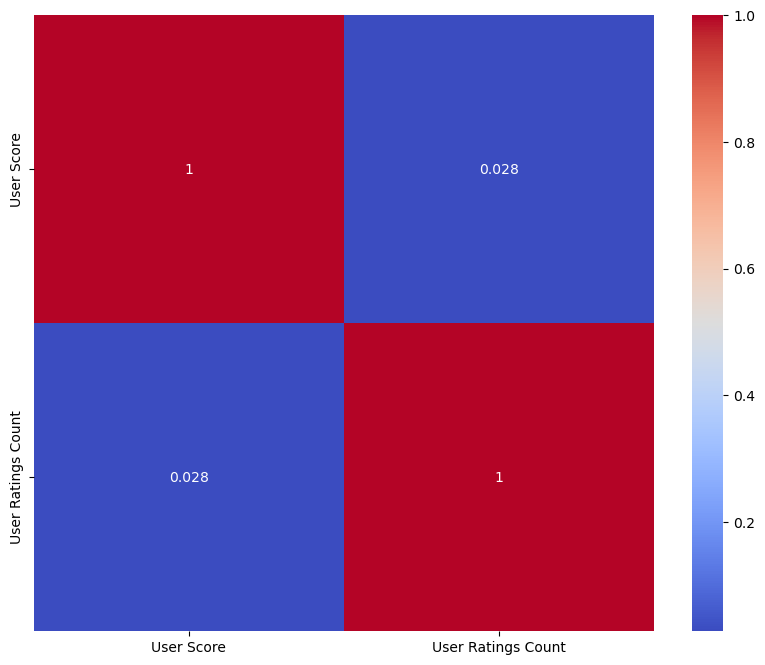

In [74]:
# correlation matrix for ratings data
correlation_matrix = VGRatingsData.corr(numeric_only=True)

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

# seems that more ratings does not necessarily correlate to higher or lower ratings

*No significant correlations among quantitative variables in VGRtaingsData*

In [75]:
VGSalesData.dtypes

Name                object
Platform            object
Year_of_Release      int32
Genre               object
Publisher           object
NA_Sales           float64
EU_Sales           float64
JP_Sales           float64
Other_Sales        float64
Global_Sales       float64
Critic_Score       float64
Critic_Count       float64
User_Score         float64
User_Count         float64
Developer           object
Rating              object
dtype: object

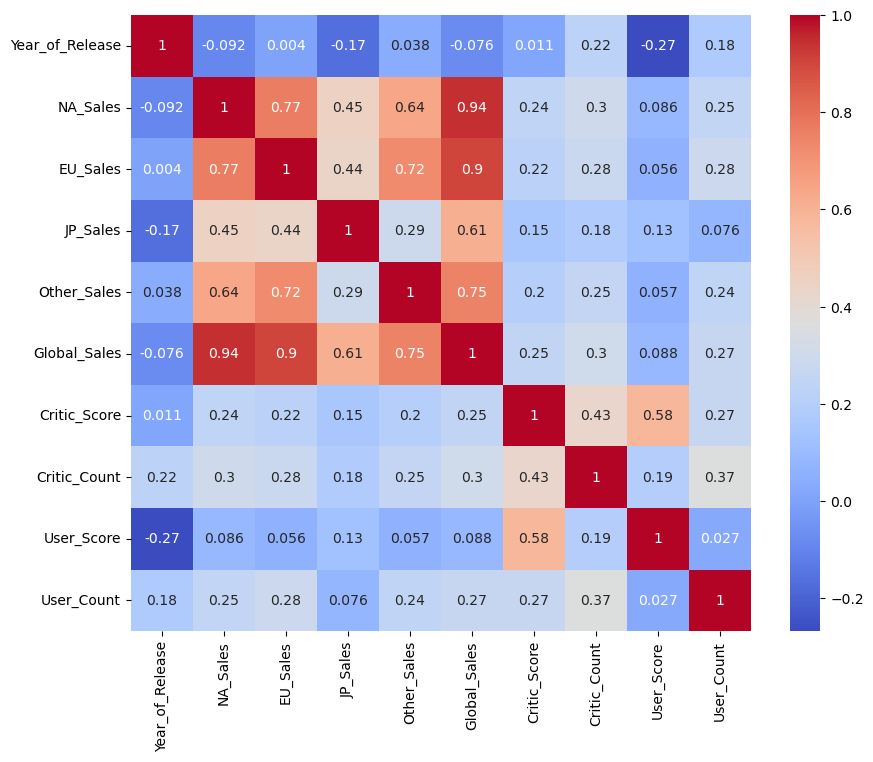

In [76]:
# correlation matrix for sales data
correlation_matrix = VGSalesData.corr(numeric_only=True)

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

# global sales highy correlated with na sales and global sales

*Some values are highly correlated!*

In [77]:
# Find highly correlated pairs (>0.7)
highly_correlated_pairs = correlation_matrix.unstack().sort_values(kind="quicksort", ascending=False)
print(highly_correlated_pairs[(abs(highly_correlated_pairs) > 0.7) & (abs(highly_correlated_pairs) < 1)])

Global_Sales  NA_Sales        0.941235
NA_Sales      Global_Sales    0.941235
Global_Sales  EU_Sales        0.901670
EU_Sales      Global_Sales    0.901670
              NA_Sales        0.766546
NA_Sales      EU_Sales        0.766546
Other_Sales   Global_Sales    0.748909
Global_Sales  Other_Sales     0.748909
Other_Sales   EU_Sales        0.722679
EU_Sales      Other_Sales     0.722679
dtype: float64


Highly Correlated Pairs Are:
* Global_Sales & NA_Sales (0.941)
* Global_Sales & EU_Sales (0.901)
* **NA_Sales & EU_Sales (0.765)**
* Other_Sales & Global Sales (0.749)
* **Other_Sales & EU_Sales (0.723)**

The only ones worth noting are bolded! This is because anything above related to global_sales, is entirely incorporated into it. All NA_Sales numbers are added to global_sales to create global_sales by definition.

In [78]:
# removing outliers as they signnficantly skewed the graphs
# no outlier df
VGSales_no_outliers = VGSalesData

# Calculating Z-scores
VGSales_no_outliers['Z_Score_NA_Sales'] = np.abs(stats.zscore(VGSales_no_outliers['NA_Sales']))
VGSales_no_outliers['Z_Score_EU_Sales'] = np.abs(stats.zscore(VGSales_no_outliers['EU_Sales']))
VGSales_no_outliers['Z_Score_Global_Sales'] = np.abs(stats.zscore(VGSales_no_outliers['Global_Sales']))
VGSales_no_outliers['Z_Score_Other_Sales'] = np.abs(stats.zscore(VGSales_no_outliers['Other_Sales']))

# Filtering out outliers
VGSales_no_outliers = VGSales_no_outliers[(VGSales_no_outliers['Z_Score_NA_Sales'] < 3)]
VGSales_no_outliers = VGSales_no_outliers[(VGSales_no_outliers['Z_Score_EU_Sales'] < 3)]
VGSales_no_outliers = VGSales_no_outliers[(VGSales_no_outliers['Z_Score_Global_Sales'] < 3)]
VGSales_no_outliers = VGSales_no_outliers[(VGSales_no_outliers['Z_Score_Other_Sales'] < 3)]

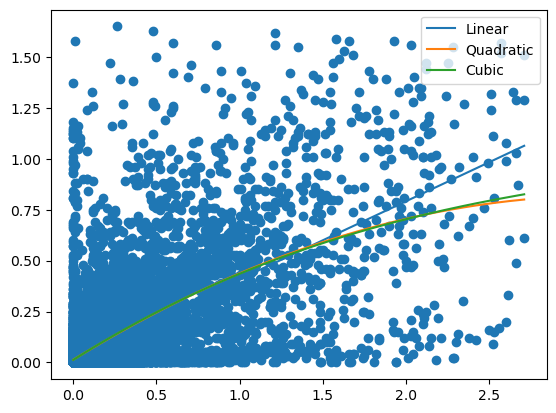

Linear Fit RMSE: 0.1519526546490401
Quadratic Fit RMSE: 0.15072930548289343
Cubic Fit RMSE: 0.1507231748922701


In [79]:
VGSales_no_outliers = VGSales_no_outliers.sort_values(by='NA_Sales')
x = VGSales_no_outliers['NA_Sales']
y = VGSales_no_outliers['EU_Sales']
plt.scatter(x, y)

# linear
p1 = polyfit(x, y, 1)
plt.plot(x, poly1d(p1)(x), label='Linear')

# quadratic
p2 = polyfit(x, y, 2)
plt.plot(x, poly1d(p2)(x), label='Quadratic')

# cubic
p3 = polyfit(x, y, 3)
plt.plot(x, poly1d(p3)(x), label='Cubic')

plt.legend()
plt.show()

# predictions for each model
y_pred_linear = poly1d(polyfit(x, y, 1))(x)
y_pred_quadratic = poly1d(polyfit(x, y, 2))(x)
y_pred_cubic = poly1d(polyfit(x, y, 3))(x)

# RMSE for each model
rmse_linear = sqrt(mean_squared_error(y, y_pred_linear))
rmse_quadratic = sqrt(mean_squared_error(y, y_pred_quadratic))
rmse_cubic = sqrt(mean_squared_error(y, y_pred_cubic))

# Print RMSE values
print("Linear Fit RMSE:", rmse_linear)
print("Quadratic Fit RMSE:", rmse_quadratic)
print("Cubic Fit RMSE:", rmse_cubic)

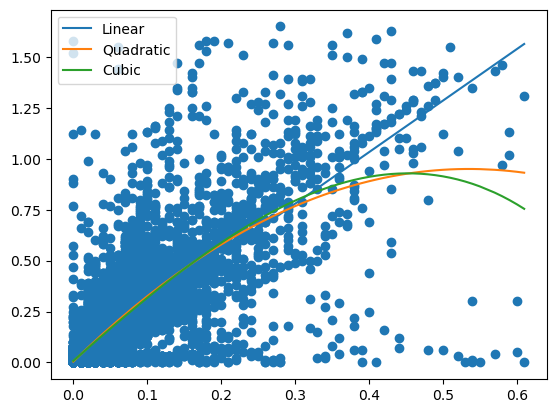

Linear RMSE: 0.12137527519800403
Quadratic RMSE: 0.11706751945353025
Cubic RMSE: 0.11688012824110015


In [80]:
VGSales_no_outliers = VGSales_no_outliers.sort_values(by='Other_Sales')

x = VGSales_no_outliers['Other_Sales']
y = VGSales_no_outliers['EU_Sales']
plt.scatter(x, y)

# linear
p1 = polyfit(x, y, 1)
plt.plot(x, poly1d(p1)(x), label='Linear')

# quadratic
p2 = polyfit(x, y, 2)
plt.plot(x, poly1d(p2)(x), label='Quadratic')

# cubic
p3 = polyfit(x, y, 3)
plt.plot(x, poly1d(p3)(x), label='Cubic')

plt.legend()
plt.show()

# predict
y_pred_linear = poly1d(polyfit(x, y, 1))(x)
y_pred_quadratic = poly1d(polyfit(x, y, 2))(x)
y_pred_cubic = poly1d(polyfit(x, y, 3))(x)

# rmse
rmse_linear = sqrt(mean_squared_error(y, y_pred_linear))
rmse_quadratic = sqrt(mean_squared_error(y, y_pred_quadratic))
rmse_cubic = sqrt(mean_squared_error(y, y_pred_cubic))

print("Linear RMSE:", rmse_linear)
print("Quadratic RMSE:", rmse_quadratic)
print("Cubic RMSE:", rmse_cubic)

In [81]:
# All relationships are generally linear. The key point is the interconnectedness of global_sales with all other sales variables

# Design

In [88]:
avg_score = VGRatingsData['User Score'].mean()

In [89]:
alt.data_transformers.disable_max_rows()

# count number of games released each year
games_per_year = VGSalesData['Year_of_Release'].value_counts().reset_index()
games_per_year.columns = ['Year_of_Release', 'Number_of_Games']
games_per_year = games_per_year.sort_values('Year_of_Release')

# histogram of games per year
click = alt.selection_point(fields=['Year_of_Release'], encodings=['x'])
histogram = alt.Chart(games_per_year).mark_bar().encode(
    x=alt.X('Year_of_Release:O', title='Release Year'),
    y=alt.Y('Number_of_Games:Q', title='Number of Games'),
    tooltip=['Year_of_Release', 'Number_of_Games'],
    color=alt.condition(click, alt.value('steelblue'), alt.value('lightgray'))).properties(
        title='Number of Games Released Each Year',
        width=600).add_params(click)

# bar chart for publisher numbers (filtered by the selection)
publisher_chart = alt.Chart(VGSalesData).mark_bar().encode(
    x=alt.X('count():Q', title='Number of Games'),
    y=alt.Y('Publisher:N', sort='-x', title='Publisher'),
    tooltip=['Publisher', 'count()'],
    color=alt.condition(click, alt.value('steelblue'), alt.value('steelblue'))).transform_filter(click).properties(
        title='Number of Games Released by Publishers',
        width=600)

alt.hconcat(histogram, publisher_chart)

# make sure to scroll up for this chart, we left the long tail for comprehensive info

alt.HConcatChart(...)

In [90]:
# interactive bubble chart that shows the relationship between the number of
# games released, their global sales, and user ratings over time

# convert 'User_Score' and 'Global_Sales' to numeric,
VGSalesData['User_Score'] = pd.to_numeric(VGSalesData['User_Score'], errors='coerce')
VGSalesData['Global_Sales'] = pd.to_numeric(VGSalesData['Global_Sales'], errors='coerce')
# make sure 'Year_of_Release' = int
VGSalesData['Year_of_Release'] = VGSalesData['Year_of_Release'].astype(int)

# calculate the total number of games, total global sales, and average user score per year
aggregated_data = VGSalesData.groupby('Year_of_Release').agg(
    Number_of_Games=('Name', 'size'),
    Total_Global_Sales=('Global_Sales', 'sum'),
    Average_User_Score=('User_Score', 'mean')).reset_index()

# bubble chart
fig = px.scatter(
    aggregated_data,
    x='Year_of_Release',
    y='Total_Global_Sales',
    size='Number_of_Games',
    color='Average_User_Score',
    hover_name='Year_of_Release',
    title = 'Temporal Analysis of Global Sales Volume (Bubble Size Represents Total Number of Games, Color Reflects Average User Scores)',
    labels={
        'Total_Global_Sales': 'Total Global Sales (Millions)',
        'Year_of_Release': 'Year of Release',
        'Number_of_Games': 'Number of Games Released',
        'Average_User_Score': 'Average User Score'},
    size_max=60, color_continuous_scale=px.colors.sequential.Plasma)

# layout
fig.update_layout(
    xaxis_title='Year of Release',
    yaxis_title='Total Global Sales (Millions USD)',
    coloraxis_colorbar=dict(title='Average User Rating'))

# frames for animation
frames = [go.Frame(
    data=[go.Scatter(
        x=aggregated_data['Year_of_Release'][aggregated_data['Year_of_Release'] == year],
        y=aggregated_data['Total_Global_Sales'][aggregated_data['Year_of_Release'] == year],
        marker=dict(size=aggregated_data['Number_of_Games'][aggregated_data['Year_of_Release'] == year]),)],
    name=str(year)) for year in aggregated_data['Year_of_Release'].unique()]
fig.frames = frames
fig.show()

In [85]:
# Choropleth with Time Slider for Regional Sales Trends
# sales by year &  region
sales_by_year_region = VGSalesData.groupby('Year_of_Release').agg({
    'NA_Sales': 'sum',
    'EU_Sales': 'sum',
    'JP_Sales': 'sum',
    'Other_Sales': 'sum'}).reset_index()

# ISO country codes for each region (to identify what other countries are for plotting)
eu_countries = ['DEU', 'GBR', 'FRA', 'ITA', 'ESP', 'POL', 'UKR', 'ROU', 'NLD', 'BEL',
                'SWE', 'CZE', 'GRC', 'PRT', 'HUN', 'BLR', 'AUT', 'CHE', 'SRB', 'BGR',
                'DNK', 'SVK', 'FIN', 'NOR', 'IRL', 'HRV', 'MDA', 'BIH', 'ALB', 'LTU',
                'SVN', 'MKD', 'LVA', 'EST', 'LUX', 'MNE', 'MLT', 'ISL', 'AND', 'LIE',
                'MCO', 'SMR', 'VAT']
na_countries = ['USA', 'CAN', 'MEX']
jpn = ['JPN']
all_countries = [country.alpha_3 for country in pycountry.countries]
other_countries = [code for code in all_countries if code not in eu_countries + na_countries + jpn]

rows_list = []

for index, row in sales_by_year_region.iterrows():
    for region_name, countries, sales in [('EU', eu_countries, row['EU_Sales']),
                                          ('NA', na_countries, row['NA_Sales']),
                                          ('JPN', jpn, row['JP_Sales']),
                                          ('Other', other_countries, row['Other_Sales'])]:
        for country in countries:
            rows_list.append({'Year': row['Year_of_Release'], 'Country': country, 'Sales': sales})
df = pd.DataFrame(rows_list)
years = sorted(VGSalesData['Year_of_Release'].dropna().unique())
fig = go.Figure()

# choropleth trace for each year
for year in years:
    year_df = df[df['Year'] == year]
    fig.add_trace(
        go.Choropleth(
            locations=year_df['Country'],
            z=year_df['Sales'],
            colorscale='Rainbow',
            zmin=df['Sales'].min(),
            zmax=df['Sales'].max(),
            marker_line_color='darkgray',
            marker_line_width=0.5,
            colorbar_title='Sales<br>Millions USD',
            visible=False))
fig.data[0].visible = True

# steps for slider
steps = []
for i, year in enumerate(years):
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig.data)},
              {"title": f"Video Game Sales Trends by Region- {year}"}],
        label=str(year))
    step["args"][0]["visible"][i] = True
    steps.append(step)

# slider
sliders = [dict(
    active=0,
    currentvalue={"prefix": "Year: "},
    steps=steps)]

fig.update_layout(
    sliders=sliders,
    geo=dict(
        showframe=False,
        showcoastlines=False,
        projection_type='natural earth'),  # mollweide
    title_text=f"Video Game Sales Trends by Region: {years[0]}")
fig.show()

In [86]:
# convert 'User Score' to numeric and drop missing rows
VGRatingsData['User Score'] = pd.to_numeric(VGRatingsData['User Score'], errors='coerce')
plot_df = VGRatingsData.dropna(subset=['User Score', 'Genres'])

# extract year
plot_df['Year_of_Release'] = pd.to_datetime(plot_df['Release Date']).dt.year

# find top 5 genres and filter data
filtered_data = plot_df[plot_df['Genres'].isin(plot_df['Genres'].value_counts().nlargest(5).index)]

# group data by 'Year_of_Release' & 'Genres'
user_scores_per_year_genre = filtered_data.groupby(['Year_of_Release', 'Genres'])['User Score'].mean().reset_index()

fig = go.Figure()

# line trace for each genre with smoothing
genres = user_scores_per_year_genre['Genres'].unique()
for genre in genres:
    genre_data = user_scores_per_year_genre[user_scores_per_year_genre['Genres'] == genre]
    fig.add_trace(go.Scatter(
        x=genre_data['Year_of_Release'],
        y=genre_data['User Score'],
        mode='lines',
        line_shape='spline',
        name=genre))

# overall avg score line
fig.add_shape(type="line",
    x0=min(user_scores_per_year_genre['Year_of_Release']),
    y0=avg_score,
    x1=max(user_scores_per_year_genre['Year_of_Release']),
    y1=avg_score,
    line=dict(
        color="grey",
        width=3,
        dash="dash",))

# annotation for avg line
fig.add_annotation(
        x=min(user_scores_per_year_genre['Year_of_Release']),
        y=avg_score,
        text="Average Rating: {:.2f}".format(avg_score),
        showarrow=True,
        arrowhead=1,
        ax=75,
        ay=25,
        bgcolor="white",
        bordercolor="grey",
        borderwidth=1,
        borderpad=4,
        font=dict(color="grey",size=12))

# interactive legend
#fig.update_layout(legend_visible=True)

fig.update_xaxes(
    tickmode='linear',
    dtick=1,
    tick0=min(user_scores_per_year_genre['Year_of_Release']),
    range=[min(user_scores_per_year_genre['Year_of_Release']), max(user_scores_per_year_genre['Year_of_Release'])])

# labels
fig.update_layout(
    title='Average User Ratings Over Time by Top 5 Genres',
    xaxis_title='Year of Release',
    yaxis_title='Average User Score',
    hovermode='x unified',
    legend_title='Genres (select)')
fig.show()

In [87]:
# filter df for only games by top 10 most popular publishers
filtered_df = VGRatingsData[VGRatingsData['Publisher'].isin(VGRatingsData['Publisher'].value_counts().head(10).index)]

# only games w/ >= 1000 user ratings
filtered_df = filtered_df[filtered_df['User Ratings Count'] >= 1000]

# 'Release Date' --> datetime
filtered_df['Release Date'] = pd.to_datetime(filtered_df['Release Date'])

# bubble chart
fig = px.scatter(filtered_df,
                 x='Release Date',
                 y='User Score',
                 size='User Ratings Count',
                 color='Publisher',
                 hover_name='Title',
                 title='Average User Ratings Over Time (Bubble Size Represents Ratings Count, Color Represents Publishers)',
                 labels={'User Ratings Count': 'Number of User Ratings'})


# average user score line
fig.add_shape(type="line",
              x0='1995-01-01 00:00:00',
              y0=avg_score,
              x1='2025-01-01 00:00:00',
              y1=avg_score,
              line=dict(color="grey", width=3, dash="dash"))

# annotation for average line
fig.add_annotation(x=filtered_df['Release Date'].min(),
                   y=avg_score,
                   text="Average Rating: {:.2f}".format(avg_score),
                   showarrow=False,
                   yshift =0,
                   bgcolor="white",
                   bordercolor="grey",
                   borderwidth=1,
                   borderpad=4,
                   font=dict(color="grey", size=12))

fig.update_layout(
    xaxis_title='Release Date',
    yaxis_title='Average User Score (0-10)',
    legend_title='Top 10 Publishers',
    transition_duration=500)

fig.show()